In [1]:
import numpy as np
import pandas as pd
import cv2
from matplotlib import pyplot as plt
from pylab import imread
from skimage.color import rgb2gray
from skimage import feature, filters
from skimage.transform import rescale, resize
from skimage.exposure import rescale_intensity
from skimage.color.adapt_rgb import adapt_rgb, each_channel, hsv_value
from skimage import filters

In [2]:
def imshows(ImageData, LabelData, rows, cols, gridType = False):
    # Convert ImageData and LabelData to List
    from matplotlib import pyplot as plt
    ImageArray = list(ImageData)
    LabelArray = list(LabelData)
    if(rows == 1 & cols == 1):
        fig = plt.figure(figsize=(20,20))
    else:
        fig = plt.figure(figsize=(cols*8,rows*5))

    for i in range(1, cols * rows + 1):
        fig.add_subplot(rows, cols, i)
        image = ImageArray[i - 1]
         # If the channel number is less than 3, we display as grayscale image
         # otherwise, we display as color image
        if (len(image.shape) < 3):
            plt.imshow(image, plt.cm.gray)
            plt.grid(gridType)
        else:
            plt.imshow(image)
            plt.grid(gridType)
    plt.title(LabelArray[i - 1])
    plt.show()
def ShowThreeImages(IM1, IM2, IM3):
    imshows([IM1, IM2, IM3], ["Image 1","Image 2", "Image 3"], 1, 3)
def ShowTwoImages(IM1, IM2):
    imshows([IM1, IM2], ["Image 1","Image 2"], 1, 2)
def ShowOneImage(IM):
    imshows([IM], ["Image"], 1, 1)
def ShowListImages(listImage, row, col):
    listCaption = []
    for i in range(len(listImage)):
        listCaption.append(str(i))
    imshows(listImage,listCaption,row,col)

## Bài 1

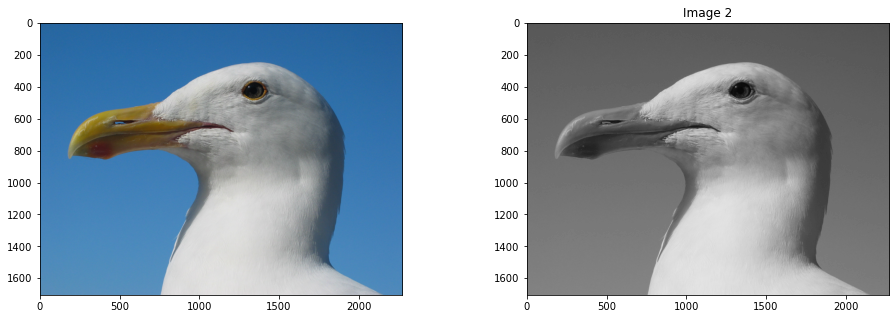

In [27]:
# Read Image
image_color = imread("Sample02/bird2.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
# Display Image
ShowTwoImages(image_color, image_gray)

#### Viết thành một function cho biết thông tin của bức ảnh

In [4]:
def image_info(src_img):
    Image = src_img.copy()
    Width = Image.shape[1]
    Height = Image.shape[0]
    Channel = len(Image.shape)
    print("Width : ", Width, " Height : ", Height, " Channel : ", Channel)
    IM = image_color.copy
    if(Channel == 2):
        print("Min Intensity: ", Image.min(), " Max Intensity: ", Image.max())
    else:
        print("Red - Min Intensity: ", Image[:,:,0].min(), " Max Intensity: ", Image[:,:,0].max())
        print("Green - Min Intensity: ", Image[:,:,1].min(), " Max Intensity: ", Image[:,:,1].max())
        print("Blue - Min Intensity: ", Image[:,:,2].min(), " Max Intensity: ", Image[:,:,2].max())

In [5]:
# Show infomation of color image
image_info(image_color)
# Show infomation of gray image
image_info(image_gray)

Width :  2272  Height :  1704  Channel :  3
Red - Min Intensity:  0  Max Intensity:  255
Green - Min Intensity:  2  Max Intensity:  255
Blue - Min Intensity:  0  Max Intensity:  255
Width :  2272  Height :  1704  Channel :  2
Min Intensity:  3  Max Intensity:  254


#### Hiển thị 24 ảnh theo bit của từng kênh màu R, G, B

In [6]:
def intToBitArray(img) :
    row ,col = img.shape
    list = []
    for i in range(row):
        for j in range(col):
            list.append (np.binary_repr( img[i][j] ,width=8 ) )
    return list #the binary_repr() fucntion returns binary values but in
                #string
                #, not integer, which has it's own perk as you will notice
def bitplane(bitImgVal , img1D ):
    bitList = [ int(i[bitImgVal] )for i in img1D]
    return bitList
def GetBitImage(index, image2D):
    ImageIn1D = intToBitArray(image2D)
    Imagebit = np.array( bitplane(index, ImageIn1D ) )
    Imagebit = np.reshape(Imagebit , image2D.shape )
    return Imagebit
def GetAllBitImage(image2D):
    image2D_Bit = list()
    for i in range(8):
        image2D_Bit.append(GetBitImage(i, image2D))
    return image2D_Bit

List have  8  images


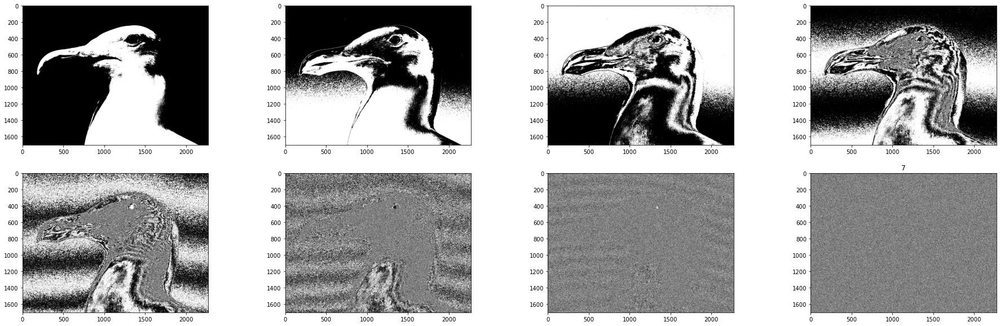

List have  8  images


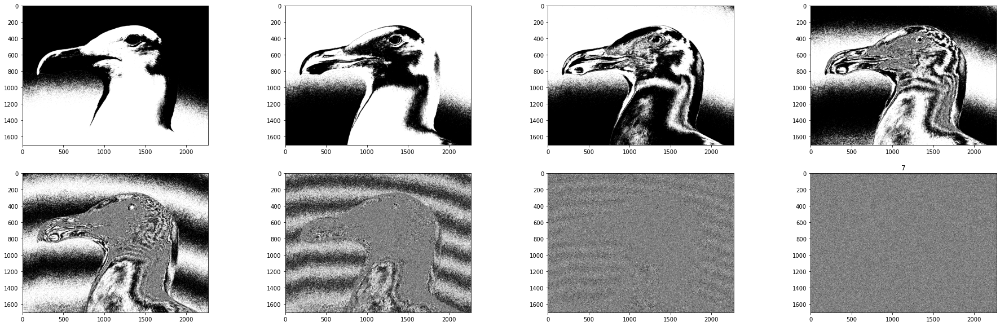

List have  8  images


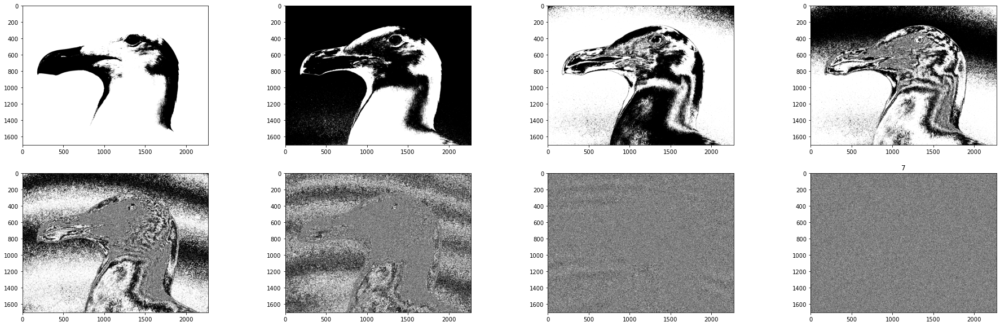

In [8]:
# Get 8 Mask Image corresponding to 8 bit of channel of color image
image2D_Bit_Red = GetAllBitImage(image_color[:,:,0])
print("List have ", len(image2D_Bit_Red), " images")
ShowListImages(image2D_Bit_Red, 2, 4)
image2D_Bit_Green = GetAllBitImage(image_color[:,:,1])
print("List have ", len(image2D_Bit_Green), " images")
ShowListImages(image2D_Bit_Green, 2, 4)
image2D_Bit_Blue = GetAllBitImage(image_color[:,:,2])
print("List have ", len(image2D_Bit_Blue), " images")
ShowListImages(image2D_Bit_Blue, 2, 4)

#### Hiển thị 24 bức ảnh theo bit của từng kênh màu H, S, V

List have  8  images


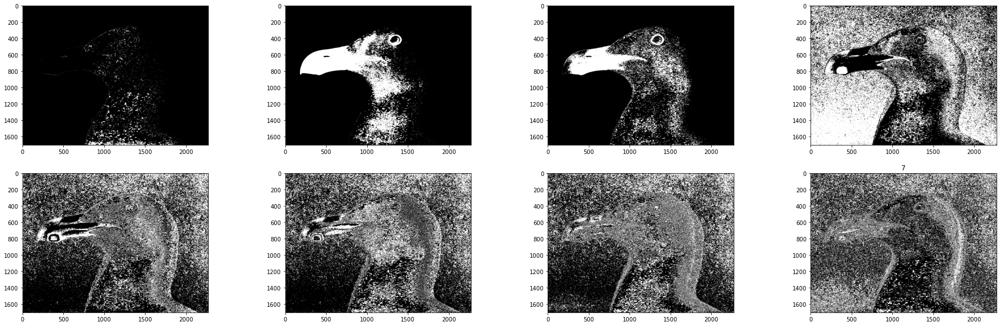

List have  8  images


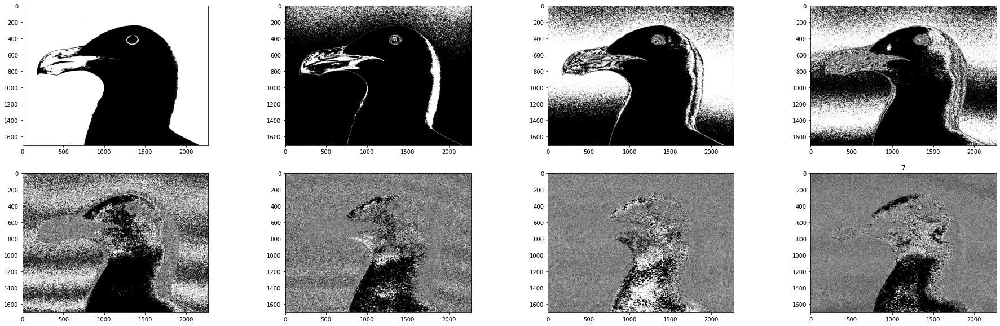

List have  8  images


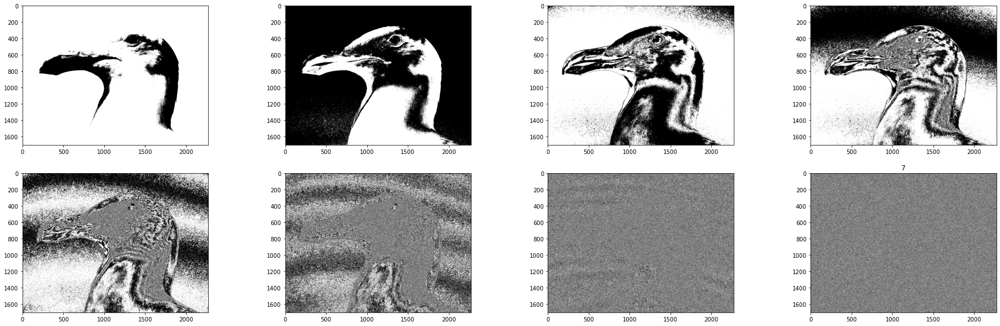

In [9]:
# Get 8 Mask Image corresponding to 8 bit of channel of hsv image 
image_hsv = cv2.cvtColor(image_color, cv2.COLOR_BGR2HSV)
image2D_Bit_H = GetAllBitImage(image_hsv[:,:,0])
print("List have ", len(image2D_Bit_H), " images")
ShowListImages(image2D_Bit_H, 2, 4)
image2D_Bit_S = GetAllBitImage(image_hsv[:,:,1])
print("List have ", len(image2D_Bit_S), " images")
ShowListImages(image2D_Bit_S, 2, 4)
image2D_Bit_V = GetAllBitImage(image_hsv[:,:,2])
print("List have ", len(image2D_Bit_V), " images")
ShowListImages(image2D_Bit_V, 2, 4)

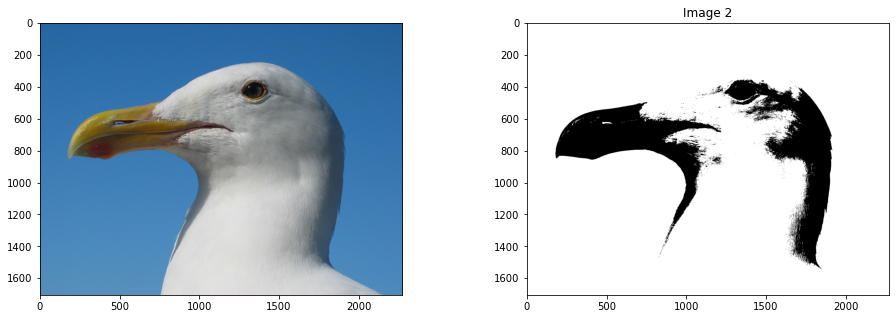

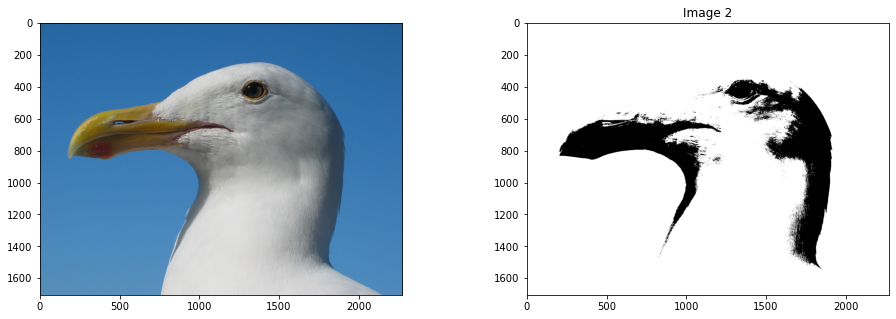

In [29]:
# Take the highest bit image
CellMask01 = image2D_Bit_Blue[0]
ShowTwoImages(image_color, CellMask01)
CellMask02 = image2D_Bit_V[0]
ShowTwoImages(image_color, CellMask02)

In [11]:
def SegmentColorImageByMask(IM, Mask):
    Mask = Mask.astype(np.uint8)
    result = cv2.bitwise_and(IM, IM, mask = Mask)
    return result

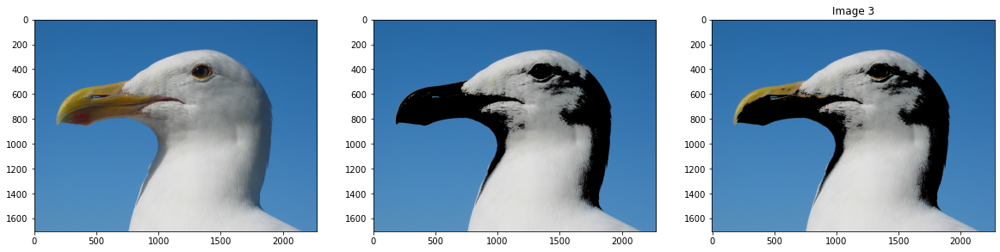

In [30]:
CellMask01_rgb = SegmentColorImageByMask(image_color, CellMask01)
CellMask02_hsv = SegmentColorImageByMask(image_color, CellMask02)
ShowThreeImages(image_color, CellMask01_rgb, CellMask02_hsv)

## Bài 2

Image Size: (1046, 1860, 3)


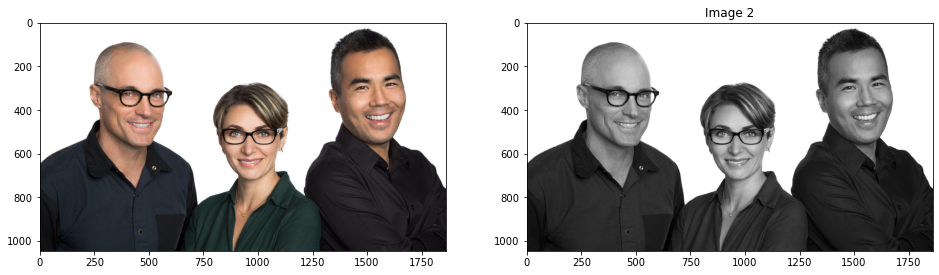

In [13]:
image_color = imread('Sample02/three-people.jpg')
image_gray = cv2.cvtColor(image_color,cv2.COLOR_BGR2GRAY)
image_hsv = cv2.cvtColor(image_color,cv2.COLOR_BGR2HSV)
print("Image Size:", image_color.shape)
ShowTwoImages(image_color,image_gray)

In [14]:
# Edge Detection on Color Image
@adapt_rgb(each_channel)
def sobel_each(image):
    return filters.sobel(image)

@adapt_rgb(hsv_value)
def sobel_hsv(image):
    return filters.sobel(image)

def edge_detection_gray(src_img, filter='sobel'):
    image_gray = cv2.cvtColor(src_img, cv2.COLOR_RGB2GRAY)
    edges = {'canny': feature.canny(image_gray),
             'sobel': filters.sobel(image_gray),
             'laplace': filters.laplace(image_gray),
             'scharr': filters.scharr(image_gray),
             'prewitt': filters.prewitt(image_gray),
             'roberts': filters.roberts(image_gray)}
    return 1 - edges[filter]

def edge_detection_color(src_img):
    image_sobel_rgb = rescale_intensity(1 - sobel_each(src_img))
    image_sobel_hsv = rescale_intensity(1 - sobel_hsv(src_img))
    return (image_sobel_rgb, image_sobel_hsv)

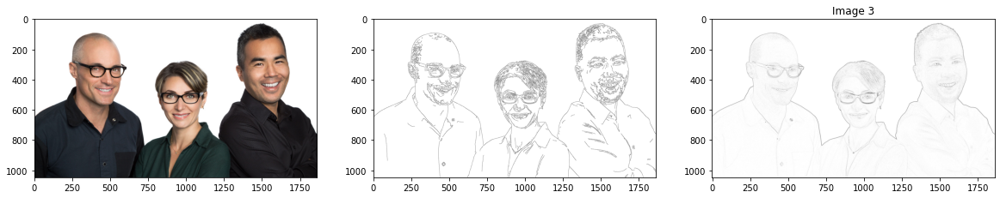

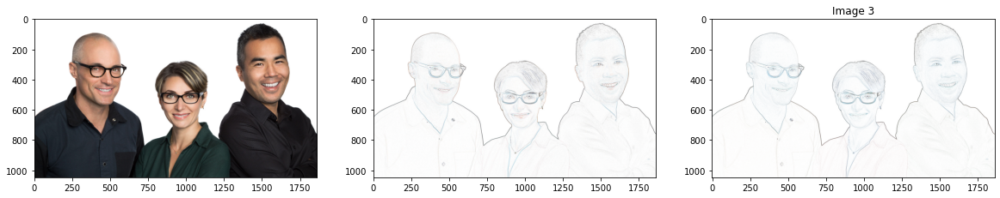

In [15]:
# Edge Detection on Gray Image
ShowThreeImages(image_color, edge_detection_gray(image_color, filter='canny'),
                edge_detection_gray(image_color, filter='roberts'))
# Edge Detection on Color Image
image_sobel_rgb, image_sobel_hsv = edge_detection_color(image_color)
ShowThreeImages(image_color, image_sobel_rgb, image_sobel_hsv)

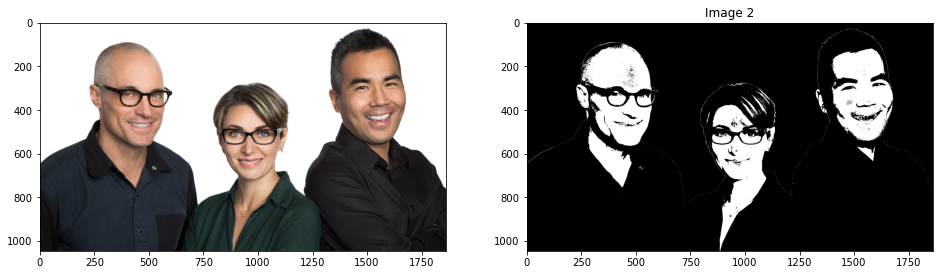

In [16]:
# Get color by range color in RGB from [0,0,150] to [255,255,255]
lower = np.array([140,85,64])
upper = np.array([246,209,193])
CellMask02 = cv2.inRange(image_color, lower, upper)
ShowTwoImages(image_color, CellMask02)

## Bài 3

Image Size: (500, 500, 3)


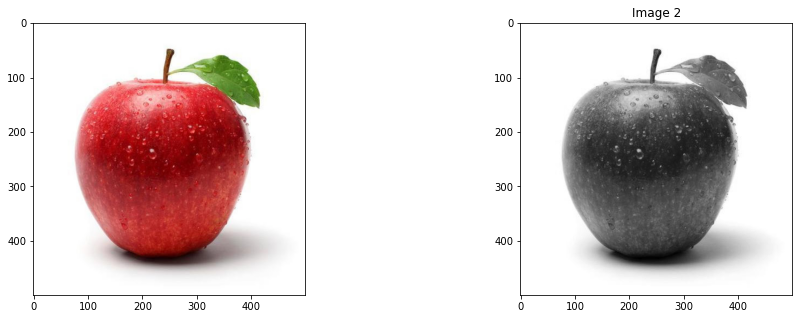

In [17]:
# Read Image
image_color = imread("Sample02/apple.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
# Display Image
print("Image Size:", image_color.shape)
ShowTwoImages(image_color, image_gray)

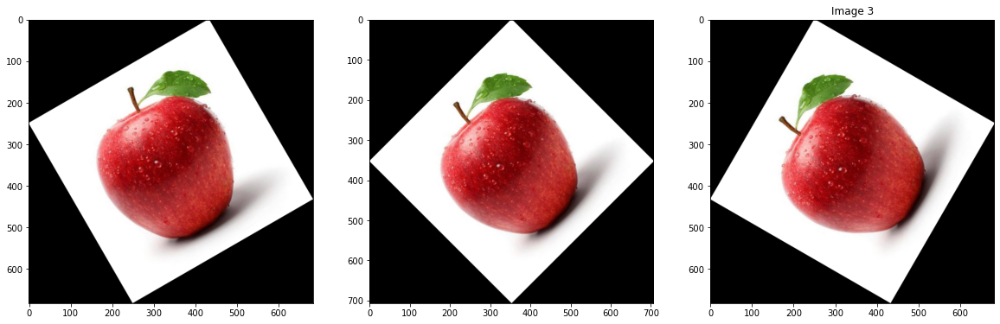

In [18]:
from skimage.transform import rotate
image_color_rotate_30_01 = rotate(image_color, 30, resize=True)
image_color_rotate_45_01 = rotate(image_color, 45,resize=True)
image_color_rotate_60_01 = rotate(image_color, 60,resize=True)
ShowThreeImages(image_color_rotate_30_01, image_color_rotate_45_01, image_color_rotate_60_01)

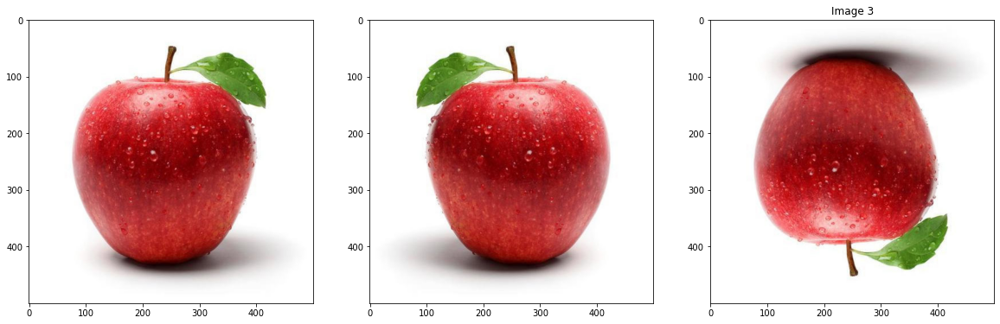

In [19]:
image_color_horizontal_flip = image_color[:, ::-1]
image_color_vertical_flip = image_color[::-1, :]
ShowThreeImages(image_color, image_color_horizontal_flip,image_color_vertical_flip)

#### My function flip

In [20]:
def flip(image, flipcode):
    # flip vertically
    if (flipcode == 0):
        n,m = image.shape[:2]
        dx = 0
        dy = n
        scan = np.array([[1,0,dx],[0,-1,dy]])
    # flip horizontally
    elif flipcode > 0:
        n,m = image.shape[:2]
        dx = m
        dy = 0
        scan = np.array([[-1,0,dx],[0,1,dy]])
    # flip vertically and horizontally
    elif flipcode < 0:
        n,m = image.shape[:2]
        dx = m
        dy = n
        scan = np.array([[-1,0,dx],[0,-1,dy]])
    out_img = np.zeros_like(image)
    for i in range(n):
        for j in range(m):
            origin_x = j
            origin_y = i
            origin_xy = np.array([origin_x,origin_y,1])

            new_xy = np.dot(scan,origin_xy)
            new_x = new_xy[0]
            new_y = new_xy[1]

            if 0 < new_x < m and 0 < new_y < n:
                out_img[new_y,new_x] = image[i,j]
    return out_img

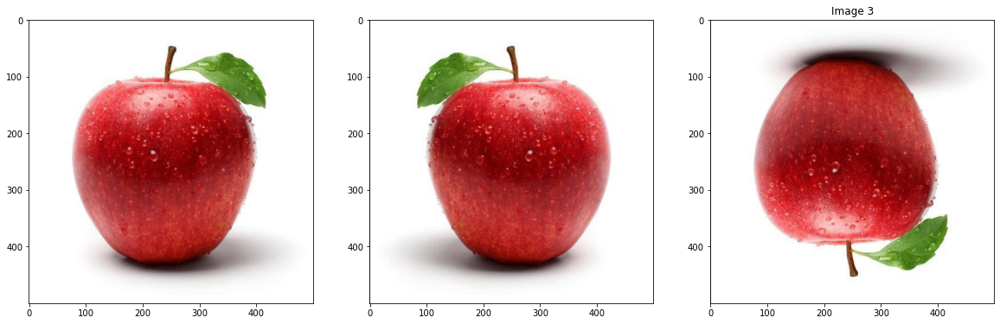

In [21]:
ShowThreeImages(image_color, flip(image_color,1),flip(image_color,0))

#### Invertion

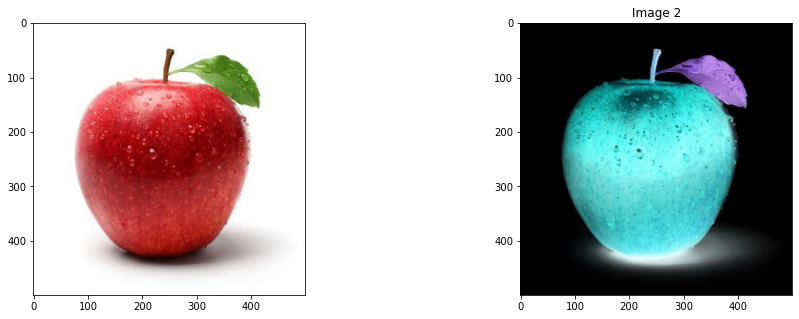

In [22]:
from skimage import util
image_color_inversion = util.invert(image_color)
ShowTwoImages(image_color, image_color_inversion)

#### enhance contrast

35.0 255.0


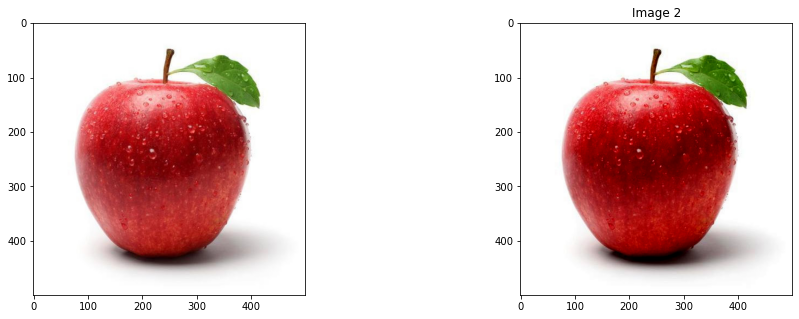

In [23]:
import numpy as np
from skimage import exposure
# take from 10 to 90 percent of color range
v_min, v_max = np.percentile(image_color, (10, 90))
better_contrast = exposure.rescale_intensity(image_color, in_range=(v_min, v_max))
print(v_min, v_max)
ShowTwoImages(image_color, better_contrast)

#### gamma và log enhancement

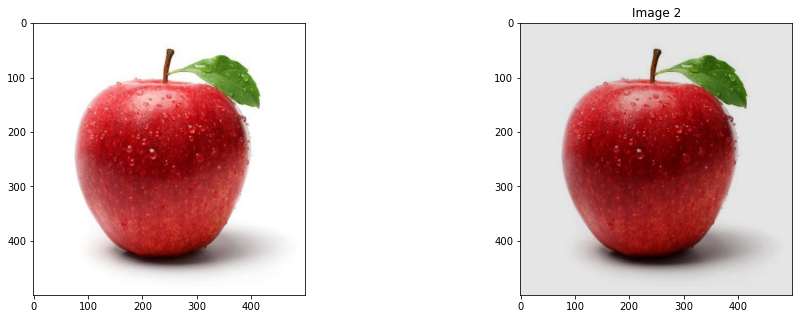

In [24]:
# gamma and gain parameters are between 0 and 1
adjusted_gamma_image = exposure.adjust_gamma(image_color, gamma=1.2, gain=0.9)
ShowTwoImages(image_color, adjusted_gamma_image)

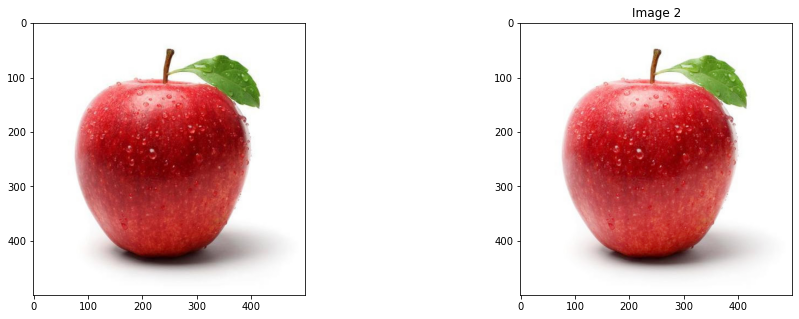

In [25]:
# Logarithmic corrected
log_correction_image = exposure.adjust_log(image_color)
ShowTwoImages(image_color, log_correction_image)